<a href="https://colab.research.google.com/github/Pradnya1208/Time-series-forecasting-using-Deep-Learning/blob/main/deep_learning_for_time_series_forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Necessary imports
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Dense, LSTM, RepeatVector, TimeDistributed, Flatten
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

%matplotlib inline
warnings.filterwarnings("ignore")

# Set seeds to make the experiment more reproducible
from tensorflow.compat.v1 import set_random_seed
from numpy.random import seed
set_random_seed(1)
seed(1)

### Loading data

In [2]:
train = pd.read_csv('./data/train.csv', parse_dates=['date'])
test = pd.read_csv('./data/test.csv', parse_dates=['date'])

### Train set

In [3]:
train.head()

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [4]:
train.describe()

,date,store,item,sales
count,913000,913000.000000,913000.000000,913000.000000
mean,2015-07-02 11:59:59.999999744,5.500000,25.500000,52.250287
min,2013-01-01 00:00:00,1.000000,1.000000,0.000000
25%,2014-04-02 00:00:00,3.000000,13.000000,30.000000
50%,2015-07-02 12:00:00,5.500000,25.500000,47.000000
75%,2016-10-01 00:00:00,8.000000,38.000000,70.000000
max,2017-12-31 00:00:00,10.000000,50.000000,231.000000
std,NaN,2.872283,14.430878,28.801144


### Time period of the train dataset

In [5]:
print('Min date from train set: %s' % train['date'].min().date())
print('Max date from train set: %s' % train['date'].max().date())

Min date from train set: 2013-01-01
Max date from train set: 2017-12-31


#### Let's find out what's the time gap between the last day from training set from the last day of the test set, this will be out lag (the amount of day that need to be forecast)

In [6]:
lag_size = (test['date'].max().date() - train['date'].max().date()).days
print('Max date from train set: %s' % train['date'].max().date())
print('Max date from test set: %s' % test['date'].max().date())
print('Forecast lag size', lag_size)

Max date from train set: 2017-12-31
Max date from test set: 2018-03-31
Forecast lag size 90


### Basic EDA

To explore the time series data first we need to aggregate the sales by day

In [7]:
daily_sales = train.groupby('date', as_index=False)['sales'].sum()
store_daily_sales = train.groupby(['store', 'date'], as_index=False)['sales'].sum()
item_daily_sales = train.groupby(['item', 'date'], as_index=False)['sales'].sum()

### Total Sales by Year

In [27]:
# Extract year from the date and group by year, summing the sales
yearly_sales = train.groupby(train['date'].dt.year)['sales'].sum().reset_index()
yearly_sales.columns = ['year', 'sales']

# Create an interactive line plot
fig = px.line(yearly_sales, x='year', y='sales', title='Total Sales by Year',
              markers=True)  # Adding markers for each data point

# Customize the layout
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Total Sales',
    hovermode='x unified'
)

# Ensure x-axis shows all years as whole numbers
fig.update_xaxes(dtick=1, tick0=yearly_sales['year'].min())

# Show the plot
fig.show()

### Overall daily sales

In [12]:
# Group by date and sum the sales
daily_sales = train.groupby('date')['sales'].sum().reset_index()

# Create an interactive line plot
fig = px.line(daily_sales, x='date', y='sales', title='Daily Sales (2013-2017)')

# Customize the layout
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Total Sales',
    hovermode='x unified'
)

# Show the plot
fig.show()

### Total Sales by Stores

In [16]:
# Group by store and sum the sales
store_sales = train.groupby('store')['sales'].sum().reset_index()

# Sort the stores by sales in descending order
store_sales = store_sales.sort_values('sales', ascending=False)

# Create a bar plot
fig = px.bar(store_sales, x='store', y='sales', 
             title='Total Sales by Store',
             labels={'store': 'Store', 'sales': 'Total Sales'},
             color='sales',
             color_continuous_scale='Viridis')

# Update the layout
fig.update_layout(
    xaxis_title='Store',
    yaxis_title='Total Sales',
    coloraxis_colorbar_title='Sales',
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=1,
        tickangle=0,
        tickfont=dict(size=10)
    ),
    height=600,  # Increase the height of the plot
    margin=dict(b=100)  # Increase bottom margin to accommodate labels
)

# Show the plot
fig.show()

### Total Sales by Items

In [18]:
# Group by Item and sum the sales
store_sales = train.groupby('item')['sales'].sum().reset_index()

# Sort the stores by sales in descending order
store_sales = store_sales.sort_values('sales', ascending=False)

# Create a bar plot
fig = px.bar(store_sales, x='item', y='sales', 
             title='Total Sales by Item',
             labels={'item': 'Item', 'sales': 'Total Sales'},
             color='sales',
             color_continuous_scale='Viridis')

# Update the layout
fig.update_layout(
    xaxis_title='Store',
    yaxis_title='Total Sales',
    coloraxis_colorbar_title='Sales',
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=1,
        tickangle=45,
        tickfont=dict(size=10)
    ),
    height=600,  # Increase the height of the plot
    margin=dict(b=100)  # Increase bottom margin to accommodate labels
)

# Show the plot
fig.show()

### Total Unique Values in Store and Item

In [25]:
unique_stores = train['store'].nunique()
unique_items = train['item'].nunique()
print(f"Total number of unique item: {unique_stores}")
print(f"Total number of unique store: {unique_items}")

Total number of unique item: 10
Total number of unique store: 50


### Daily sales by store

In [13]:
store_daily_sales_sc = []
for store in store_daily_sales['store'].unique():
    current_store_daily_sales = store_daily_sales[(store_daily_sales['store'] == store)]
    store_daily_sales_sc.append(go.Scatter(x=current_store_daily_sales['date'], y=current_store_daily_sales['sales'], name=('Store %s' % store)))

layout = go.Layout(title='Store daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=store_daily_sales_sc, layout=layout)
iplot(fig)

### Daily sales by item

In [14]:
item_daily_sales_sc = []
for item in item_daily_sales['item'].unique():
    current_item_daily_sales = item_daily_sales[(item_daily_sales['item'] == item)]
    item_daily_sales_sc.append(go.Scatter(x=current_item_daily_sales['date'], y=current_item_daily_sales['sales'], name=('Item %s' % item)))

layout = go.Layout(title='Item daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=item_daily_sales_sc, layout=layout)
iplot(fig)

#### Sub-sample train set to get only the last year of data and reduce training time

In [28]:
train = train[(train['date'] >= '2017-01-01')]

### Rearrange dataset so we can apply shift methods

In [29]:
train_gp = train.sort_values('date').groupby(['item', 'store', 'date'], as_index=False)
train_gp = train_gp.agg({'sales':['mean']})
train_gp.columns = ['item', 'store', 'date', 'sales']
train_gp.head()

,item,store,date,sales
0,1,1,2017-01-01,19.0
1,1,1,2017-01-02,15.0
2,1,1,2017-01-03,10.0
3,1,1,2017-01-04,16.0
4,1,1,2017-01-05,14.0


### Transform the data into a time series problem

In [30]:
def series_to_supervised(data, window=1, lag=1, dropnan=True):
    cols, names = list(), list()
    # Input sequence (t-n, ... t-1)
    for i in range(window, 0, -1):
        cols.append(data.shift(i))
        names += [('%s(t-%d)' % (col, i)) for col in data.columns]
    # Current timestep (t=0)
    cols.append(data)
    names += [('%s(t)' % (col)) for col in data.columns]
    
    # Target timestep (t=lag)
    cols.append(data.shift(-lag))
    names += [('%s(t+%d)' % (col, lag)) for col in data.columns]
    
    # Put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    
    # Drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

#### We will use the current timestep and the last 29 to forecast 90 days ahead

In [31]:
window = 29
lag = lag_size
series = series_to_supervised(train_gp.drop('date', axis=1), window=window, lag=lag)
series.head()

,item(t-29),store(t-29),sales(t-29),item(t-28),store(t-28),sales(t-28),item(t-27),store(t-27),sales(t-27),item(t-26),...,sales(t-2),item(t-1),store(t-1),sales(t-1),item(t),store(t),sales(t),item(t+90),store(t+90),sales(t+90)
29,1.0,1.0,19.0,1.0,1.0,15.0,1.0,1.0,10.0,1.0,...,16.0,1.0,1.0,24.0,1,1,9.0,1.0,1.0,33.0
30,1.0,1.0,15.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,...,24.0,1.0,1.0,9.0,1,1,17.0,1.0,1.0,15.0
31,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,14.0,1.0,...,9.0,1.0,1.0,17.0,1,1,15.0,1.0,1.0,21.0
32,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,...,17.0,1.0,1.0,15.0,1,1,17.0,1.0,1.0,29.0
33,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,...,15.0,1.0,1.0,17.0,1,1,24.0,1.0,1.0,19.0


#### Drop rows with different item or store values than the shifted columns

In [32]:
last_item = 'item(t-%d)' % window
last_store = 'store(t-%d)' % window
series = series[(series['store(t)'] == series[last_store])]
series = series[(series['item(t)'] == series[last_item])]

#### Remove unwanted columns

In [33]:
columns_to_drop = [('%s(t+%d)' % (col, lag)) for col in ['item', 'store']]
for i in range(window, 0, -1):
    columns_to_drop += [('%s(t-%d)' % (col, i)) for col in ['item', 'store']]
series.drop(columns_to_drop, axis=1, inplace=True)
series.drop(['item(t)', 'store(t)'], axis=1, inplace=True)

### Train/validation split

In [34]:
# Label
labels_col = 'sales(t+%d)' % lag_size
labels = series[labels_col]
series = series.drop(labels_col, axis=1)

X_train, X_valid, Y_train, Y_valid = train_test_split(series, labels.values, test_size=0.4, random_state=0)
print('Train set shape', X_train.shape)
print('Validation set shape', X_valid.shape)
X_train.head()

Train set shape (100746, 30)
Validation set shape (67164, 30)


,sales(t-29),sales(t-28),sales(t-27),sales(t-26),sales(t-25),sales(t-24),sales(t-23),sales(t-22),sales(t-21),sales(t-20),...,sales(t-9),sales(t-8),sales(t-7),sales(t-6),sales(t-5),sales(t-4),sales(t-3),sales(t-2),sales(t-1),sales(t)
18801,97.0,111.0,90.0,115.0,123.0,70.0,99.0,74.0,107.0,108.0,...,85.0,95.0,123.0,109.0,127.0,132.0,87.0,101.0,102.0,114.0
160385,38.0,43.0,43.0,55.0,47.0,51.0,38.0,41.0,37.0,59.0,...,41.0,38.0,38.0,53.0,53.0,45.0,44.0,24.0,30.0,37.0
73123,55.0,45.0,41.0,46.0,47.0,36.0,30.0,46.0,41.0,42.0,...,38.0,36.0,40.0,50.0,44.0,44.0,40.0,38.0,50.0,49.0
90428,139.0,157.0,85.0,99.0,136.0,110.0,121.0,123.0,147.0,91.0,...,130.0,128.0,128.0,95.0,116.0,110.0,117.0,118.0,129.0,132.0
167151,86.0,58.0,88.0,87.0,114.0,113.0,64.0,76.0,87.0,81.0,...,55.0,66.0,59.0,53.0,63.0,59.0,77.0,39.0,56.0,62.0


### MLP for Time Series Forecasting

* First we will use a Multilayer Perceptron model or MLP model, here our model will have input features equal to the window size.
* The thing with MLP models is that the model don't take the input as sequenced data, so for the model, it is just receiving inputs and don't treat them as sequenced data, that may be a problem since the model won't see the data with the sequence patter that it has.
* Input shape **[samples, timesteps]**.

In [35]:
epochs = 40
batch = 256
lr = 0.0003
adam = optimizers.Adam(lr)

In [36]:
model_mlp = Sequential()
model_mlp.add(Dense(100, activation='relu', input_dim=X_train.shape[1]))
model_mlp.add(Dense(1))
model_mlp.compile(loss='mse', optimizer=adam)

In [37]:
mlp_history = model_mlp.fit(X_train.values, Y_train, validation_data=(X_valid.values, Y_valid), epochs=epochs, verbose=2)

Epoch 1/40
3149/3149 - 1s - 474us/step - loss: 408.5231 - val_loss: 377.5473
Epoch 2/40
3149/3149 - 1s - 334us/step - loss: 366.2611 - val_loss: 366.9951
Epoch 3/40
3149/3149 - 1s - 363us/step - loss: 357.9221 - val_loss: 360.0875
Epoch 4/40
3149/3149 - 1s - 346us/step - loss: 354.9233 - val_loss: 356.7866
Epoch 5/40
3149/3149 - 1s - 344us/step - loss: 352.8942 - val_loss: 355.4879
Epoch 6/40
3149/3149 - 1s - 349us/step - loss: 351.3571 - val_loss: 351.3859
Epoch 7/40
3149/3149 - 1s - 367us/step - loss: 350.2177 - val_loss: 351.4583
Epoch 8/40
3149/3149 - 1s - 344us/step - loss: 349.1610 - val_loss: 349.5310
Epoch 9/40
3149/3149 - 1s - 344us/step - loss: 348.6693 - val_loss: 348.6132
Epoch 10/40
3149/3149 - 1s - 343us/step - loss: 347.4530 - val_loss: 348.2749
Epoch 11/40
3149/3149 - 1s - 332us/step - loss: 346.7682 - val_loss: 347.8495
Epoch 12/40
3149/3149 - 1s - 361us/step - loss: 346.1420 - val_loss: 348.5959
Epoch 13/40
3149/3149 - 1s - 345us/step - loss: 345.4310 - val_loss: 348.

### CNN for Time Series Forecasting

* For the CNN model we will use one convolutional hidden layer followed by a max pooling layer. The filter maps are then flattened before being interpreted by a Dense layer and outputting a prediction.
* The convolutional layer should be able to identify patterns between the timesteps.
* Input shape **[samples, timesteps, features]**.

#### Data preprocess
* Reshape from [samples, timesteps] into [samples, timesteps, features].
* This same reshaped data will be used on the CNN and the LSTM model.

In [38]:
X_train_series = X_train.values.reshape((X_train.shape[0], X_train.shape[1], 1))
X_valid_series = X_valid.values.reshape((X_valid.shape[0], X_valid.shape[1], 1))
print('Train set shape', X_train_series.shape)
print('Validation set shape', X_valid_series.shape)

Train set shape (100746, 30, 1)
Validation set shape (67164, 30, 1)


In [42]:
from tensorflow.keras.optimizers import Adam

model_cnn = Sequential()
model_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
model_cnn.add(MaxPooling1D(pool_size=2))
model_cnn.add(Flatten())
model_cnn.add(Dense(50, activation='relu'))
model_cnn.add(Dense(1))

# Create a new Adam optimizer instance
adam = Adam()

model_cnn.compile(loss='mse', optimizer=adam)

In [43]:
import tensorflow as tf

tf.keras.backend.clear_session()

# Then define your model as before
model_cnn = Sequential()
model_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
model_cnn.add(MaxPooling1D(pool_size=2))
model_cnn.add(Flatten())
model_cnn.add(Dense(50, activation='relu'))
model_cnn.add(Dense(1))
model_cnn.compile(loss='mse', optimizer=adam)

In [44]:
cnn_history = model_cnn.fit(X_train_series, Y_train, validation_data=(X_valid_series, Y_valid), epochs=epochs, verbose=2)

Epoch 1/40
3149/3149 - 3s - 964us/step - loss: 416.3650 - val_loss: 408.5045
Epoch 2/40
3149/3149 - 3s - 856us/step - loss: 381.9084 - val_loss: 383.6523
Epoch 3/40
3149/3149 - 3s - 861us/step - loss: 371.0582 - val_loss: 372.1963
Epoch 4/40
3149/3149 - 3s - 817us/step - loss: 366.9130 - val_loss: 368.8511
Epoch 5/40
3149/3149 - 3s - 831us/step - loss: 364.0128 - val_loss: 363.7281
Epoch 6/40
3149/3149 - 3s - 832us/step - loss: 361.8610 - val_loss: 360.9010
Epoch 7/40
3149/3149 - 3s - 828us/step - loss: 360.2266 - val_loss: 358.1522
Epoch 8/40
3149/3149 - 3s - 844us/step - loss: 359.5387 - val_loss: 356.2533
Epoch 9/40
3149/3149 - 3s - 859us/step - loss: 358.6827 - val_loss: 355.2412
Epoch 10/40
3149/3149 - 3s - 801us/step - loss: 357.9293 - val_loss: 354.1134
Epoch 11/40
3149/3149 - 2s - 792us/step - loss: 357.1519 - val_loss: 354.1257
Epoch 12/40
3149/3149 - 3s - 822us/step - loss: 356.6213 - val_loss: 354.4777
Epoch 13/40
3149/3149 - 3s - 807us/step - loss: 356.2627 - val_loss: 353.

### LSTM for Time Series Forecasting

* Now the LSTM model actually sees the input data as a sequence, so it's able to learn patterns from sequenced data (assuming it exists) better than the other ones, especially patterns from long sequences.
* Input shape **[samples, timesteps, features]**.

In [47]:
# Define the LSTM model
model_lstm = Sequential()
model_lstm.add(LSTM(50, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
model_lstm.add(Dense(1))

# Create a new optimizer instance
adam_optimizer = Adam()

# Compile the model with the new optimizer
model_lstm.compile(loss='mse', optimizer=adam_optimizer)

In [48]:
# Fit the model
lstm_history = model_lstm.fit(X_train_series, Y_train, validation_data=(X_valid_series, Y_valid), epochs=epochs, verbose=2)##

Epoch 1/40
3149/3149 - 15s - 5ms/step - loss: 5663348224.0000 - val_loss: 1104.3314
Epoch 2/40
3149/3149 - 12s - 4ms/step - loss: 94426.9688 - val_loss: 1120.3788
Epoch 3/40
3149/3149 - 12s - 4ms/step - loss: 1146.2375 - val_loss: 1121.1149
Epoch 4/40
3149/3149 - 12s - 4ms/step - loss: 8882.8662 - val_loss: 1097.1881
Epoch 5/40
3149/3149 - 12s - 4ms/step - loss: 1247.8744 - val_loss: 1051.6823
Epoch 6/40
3149/3149 - 12s - 4ms/step - loss: 1297.0168 - val_loss: 1339.6605
Epoch 7/40
3149/3149 - 12s - 4ms/step - loss: 1851.8595 - val_loss: 4652.4795
Epoch 8/40
3149/3149 - 12s - 4ms/step - loss: 2053.6567 - val_loss: 3682.3210
Epoch 9/40
3149/3149 - 12s - 4ms/step - loss: 98277.2344 - val_loss: 529.5407
Epoch 10/40
3149/3149 - 12s - 4ms/step - loss: 548.5741 - val_loss: 529.5337
Epoch 11/40
3149/3149 - 12s - 4ms/step - loss: 613.1366 - val_loss: 607.9698
Epoch 12/40
3149/3149 - 12s - 4ms/step - loss: 663.6279 - val_loss: 583.1970
Epoch 13/40
3149/3149 - 12s - 4ms/step - loss: 2652.0332 - v

### CNN-LSTM for Time Series Forecasting
* Input shape **[samples, subsequences, timesteps, features]**.

#### Model explanation from the [article](https://machinelearningmastery.com/how-to-get-started-with-deep-learning-for-time-series-forecasting-7-day-mini-course/)
> "The benefit of this model is that the model can support very long input sequences that can be read as blocks or subsequences by the CNN model, then pieced together by the LSTM model."
>
> "When using a hybrid CNN-LSTM model, we will further divide each sample into further subsequences. The CNN model will interpret each sub-sequence and the LSTM will piece together the interpretations from the subsequences. As such, we will split each sample into 2 subsequences of 2 times per subsequence."
>
> "The CNN will be defined to expect 2 timesteps per subsequence with one feature. The entire CNN model is then wrapped in TimeDistributed wrapper layers so that it can be applied to each subsequence in the sample. The results are then interpreted by the LSTM layer before the model outputs a prediction."

#### Data preprocess
* Reshape from [samples, timesteps, features] into [samples, subsequences, timesteps, features].

In [49]:
subsequences = 2
timesteps = X_train_series.shape[1]//subsequences
X_train_series_sub = X_train_series.reshape((X_train_series.shape[0], subsequences, timesteps, 1))
X_valid_series_sub = X_valid_series.reshape((X_valid_series.shape[0], subsequences, timesteps, 1))
print('Train set shape', X_train_series_sub.shape)
print('Validation set shape', X_valid_series_sub.shape)

Train set shape (100746, 2, 15, 1)
Validation set shape (67164, 2, 15, 1)


In [52]:
# Define the CNN-LSTM model
model_cnn_lstm = Sequential()
model_cnn_lstm.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, X_train_series_sub.shape[2], X_train_series_sub.shape[3])))
model_cnn_lstm.add(TimeDistributed(MaxPooling1D(pool_size=2)))
model_cnn_lstm.add(TimeDistributed(Flatten()))
model_cnn_lstm.add(LSTM(50, activation='relu'))
model_cnn_lstm.add(Dense(1))

# Create a new optimizer instance
adam_optimizer = Adam()

# Compile the model with the new optimizer
model_cnn_lstm.compile(loss='mse', optimizer=adam_optimizer)

In [53]:
# Fit the model
cnn_lstm_history = model_cnn_lstm.fit(X_train_series_sub, Y_train, validation_data=(X_valid_series_sub, Y_valid), epochs=epochs, verbose=2)

Epoch 1/40
3149/3149 - 9s - 3ms/step - loss: 442.9624 - val_loss: 423.3297
Epoch 2/40
3149/3149 - 8s - 2ms/step - loss: 419.4192 - val_loss: 412.4869
Epoch 3/40
3149/3149 - 8s - 3ms/step - loss: 415.6411 - val_loss: 407.3003
Epoch 4/40
3149/3149 - 8s - 2ms/step - loss: 412.4618 - val_loss: 403.8839
Epoch 5/40
3149/3149 - 7s - 2ms/step - loss: 409.5059 - val_loss: 400.5805
Epoch 6/40
3149/3149 - 8s - 2ms/step - loss: 405.6881 - val_loss: 397.8319
Epoch 7/40
3149/3149 - 8s - 2ms/step - loss: 401.0742 - val_loss: 392.6042
Epoch 8/40
3149/3149 - 8s - 2ms/step - loss: 396.5262 - val_loss: 389.5417
Epoch 9/40
3149/3149 - 7s - 2ms/step - loss: 392.8260 - val_loss: 385.3434
Epoch 10/40
3149/3149 - 8s - 2ms/step - loss: 388.4118 - val_loss: 380.8311
Epoch 11/40
3149/3149 - 7s - 2ms/step - loss: 383.9277 - val_loss: 375.8156
Epoch 12/40
3149/3149 - 8s - 2ms/step - loss: 378.2753 - val_loss: 371.0592
Epoch 13/40
3149/3149 - 7s - 2ms/step - loss: 373.1375 - val_loss: 368.4256
Epoch 14/40
3149/3149

### Comparing models

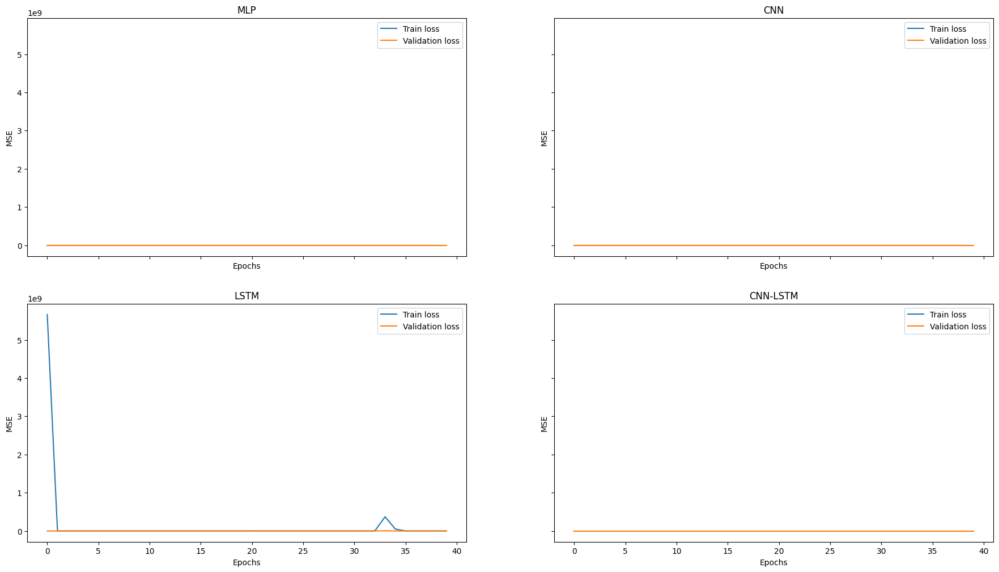

In [54]:
import matplotlib.pyplot as plt

# Assuming your training history objects are:
# mlp_history, cnn_history, lstm_history, cnn_lstm_history

fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(22, 12))
ax1, ax2 = axes[0]
ax3, ax4 = axes[1]

if 'mlp_history' in globals():
    ax1.plot(mlp_history.history['loss'], label='Train loss')
    ax1.plot(mlp_history.history['val_loss'], label='Validation loss')
    ax1.legend(loc='best')
    ax1.set_title('MLP')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('MSE')

if 'cnn_history' in globals():
    ax2.plot(cnn_history.history['loss'], label='Train loss')
    ax2.plot(cnn_history.history['val_loss'], label='Validation loss')
    ax2.legend(loc='best')
    ax2.set_title('CNN')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('MSE')

if 'lstm_history' in globals():
    ax3.plot(lstm_history.history['loss'], label='Train loss')
    ax3.plot(lstm_history.history['val_loss'], label='Validation loss')
    ax3.legend(loc='best')
    ax3.set_title('LSTM')
    ax3.set_xlabel('Epochs')
    ax3.set_ylabel('MSE')

if 'cnn_lstm_history' in globals():
    ax4.plot(cnn_lstm_history.history['loss'], label='Train loss')
    ax4.plot(cnn_lstm_history.history['val_loss'], label='Validation loss')
    ax4.legend(loc='best')
    ax4.set_title('CNN-LSTM')
    ax4.set_xlabel('Epochs')
    ax4.set_ylabel('MSE')

plt.show()

#### MLP on train and validation

In [55]:
mlp_train_pred = model_mlp.predict(X_train.values)
mlp_valid_pred = model_mlp.predict(X_valid.values)
print('Train rmse:', np.sqrt(mean_squared_error(Y_train, mlp_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(Y_valid, mlp_valid_pred)))

3149/3149 ━━━━━━━━━━━━━━━━━━━━ 1s 197us/step
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 0s 217us/step
Train rmse: 18.330281414442858
Validation rmse: 18.467006654021006


#### CNN on train and validation

In [56]:
cnn_train_pred = model_cnn.predict(X_train_series)
cnn_valid_pred = model_cnn.predict(X_valid_series)
print('Train rmse:', np.sqrt(mean_squared_error(Y_train, cnn_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(Y_valid, cnn_valid_pred)))

3149/3149 ━━━━━━━━━━━━━━━━━━━━ 1s 353us/step
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 1s 334us/step
Train rmse: 18.61425055511652
Validation rmse: 18.706343863255576


#### LSTM on train and validation

In [57]:
lstm_train_pred = model_lstm.predict(X_train_series)
lstm_valid_pred = model_cnn.predict(X_valid_series)
print('Train rmse:', np.sqrt(mean_squared_error(Y_train, lstm_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(Y_valid, lstm_valid_pred)))

3149/3149 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 1s 335us/step
Train rmse: 87.75776359520917
Validation rmse: 18.706343863255576


#### CNN-LSTM on train and validation

In [58]:
cnn_lstm_train_pred = model_cnn_lstm.predict(X_train_series_sub)
cnn_lstm_valid_pred = model_cnn_lstm.predict(X_valid_series_sub)
print('Train rmse:', np.sqrt(mean_squared_error(Y_train, cnn_lstm_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(Y_valid, cnn_lstm_valid_pred)))

3149/3149 ━━━━━━━━━━━━━━━━━━━━ 2s 516us/step
2099/2099 ━━━━━━━━━━━━━━━━━━━━ 1s 581us/step
Train rmse: 18.728294449506997
Validation rmse: 18.77946341230274
